# Поиск товара на фотографии


**Описание задачи**


Товар может занимать только часть фотографии: обувь на ногах модели, серьги в ушах и.т.п На некоторых фотографиях вообще может не быть самого товара:


<img src ="https://ml.gan4x4.ru/wb/crop/content/29028922.jpg" width="200">


<img src ="https://ml.gan4x4.ru/wb/crop/content/18327379.jpg" width="200">


<img src ="https://ml.gan4x4.ru/wb/crop/content/42648846.jpg" width="200">


Для дальнейшего поиска похожих товаров важно локализовать товар на конкретном фото, т.е. предсказывать ограничивающий прямоугольник (bounding box) в который попадает  изображение товара и определить класс объекта в этом прямоугольнике.


В датасете 13 категорий товаров:

accessories (аксессуары/украшения)


* bag (сумка)
* belt (ремень)
* dress (платье)
* glasses (очки)
* headwear (то, что носят на голове, например головной убор или заколка)
* outer (верхняя одежда)
* pants (штаны)
* scarf (шарф)
* shoe (обувь)
* shorts (шорты)
* skirt (юбка)
* top (блузка, футболка, майка, кардиган и т.п)

Нужно предложть способ детектировать объекты этих классов на изображениях.
И оценить качество детектирования.

**Особенности разметки:**
* Некоторые изображения могут не содержать ни одного объекта
* Если объект виден частично, каждая его часть размечается отдельным bounding box
* несколько объектов одного класса находящихся рядом размечаются разными bounding box


**Дополнительно:** Допускаеться использование дополнительных данных, и предобученных моделей.

## Порядок выполнения задания

Сделаем EDA, препроцесснем и выберем baseline model, оценим резы с точки зрения классических метрик детекции и времени.

#  Загрузка датасета

По [ссылке](https://ml.gan4x4.ru/wb/crop/clothes4/student.zip) находится архив содержащий изображения и разметку в [формате YOLO](https://stackoverflow.com/questions/56004483/what-is-a-multi-headed-model-and-what-exactly-is-a-head-in-a-model)

In [ ]:
!wget -nc https://ml.gan4x4.ru/wb/crop/clothes4/student.zip
!unzip student.zip
!pip install ultralytics
!pip install roboflow
!pip uninstall torch torchvision torchaudio -y
!pip install torch torchvision torchaudio
!pip install numpy scikit-learn
!pip install yolov8
!pip install torch torchvision

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: images/111089895.jpg    
  inflating: images/104552384.jpg    
  inflating: images/98811215.jpg     
  inflating: images/82591639.jpg     
  inflating: images/81944164.jpg     
  inflating: images/151371621.jpg    
  inflating: images/145490140.jpg    
  inflating: images/145003494.jpg    
  inflating: images/141771425.jpg    
  inflating: images/117752942.jpg    
  inflating: images/103227725.jpg    
  inflating: images/61142587.jpg     
  inflating: images/36462333.jpg     
  inflating: images/17102525.jpg     
  inflating: images/9548394.jpg      
  inflating: images/7983297.jpg      
  inflating: images/7977603.jpg      
  inflating: images/109003016.jpg    
  inflating: images/105818087.jpg    
  inflating: images/77200384.jpg     
  inflating: images/59970270.jpg     
  inflating: images/59154199.jpg     
  inflating: images/45361921.jpg     
  inflating: images/20955436.jpg     
  inflating: images/

In [ ]:
from ultralytics import YOLO
import torch
import matplotlib.pyplot as plt
import numpy as np
import cv2
from IPython.display import Image as DisplayImage
from PIL import Image as PILImage, ImageDraw, ImageFont
from roboflow import Roboflow
import os
import pandas as pd
import shutil
from sklearn.model_selection import train_test_split
import random
from collections import Counter
import yaml


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Анализ данных (EDA)

In [ ]:
folder_path = "/content/images"
files = os.listdir(folder_path)

num_objects = len(files)

print(f"Number of objects in the folder: {num_objects}")

Number of objects in the folder: 3968


Оценим соотношение классов

In [ ]:
def load_annotations(directory):
    all_annotations = pd.DataFrame(columns=['class_id'])

    for filename in os.listdir(directory):
        if filename.endswith('.txt') and not filename.startswith('classes'):
            file_path = os.path.join(directory, filename)
            annotations = pd.read_csv(file_path, delim_whitespace=True, usecols=[0], names=['class_id'])
            all_annotations = pd.concat([all_annotations, annotations], ignore_index=True)

    return all_annotations

def count_classes(annotations):
    class_counts = annotations['class_id'].value_counts().sort_index()
    return class_counts

annotations_directory = '/content/labels'

annotations = load_annotations(annotations_directory)

class_balance = count_classes(annotations)

print(class_balance)

class_id
0     2411
1      590
2      409
3      703
4      308
5      258
6     1392
7     3463
8       69
9     2855
10     137
11     151
12    3187
Name: count, dtype: int64


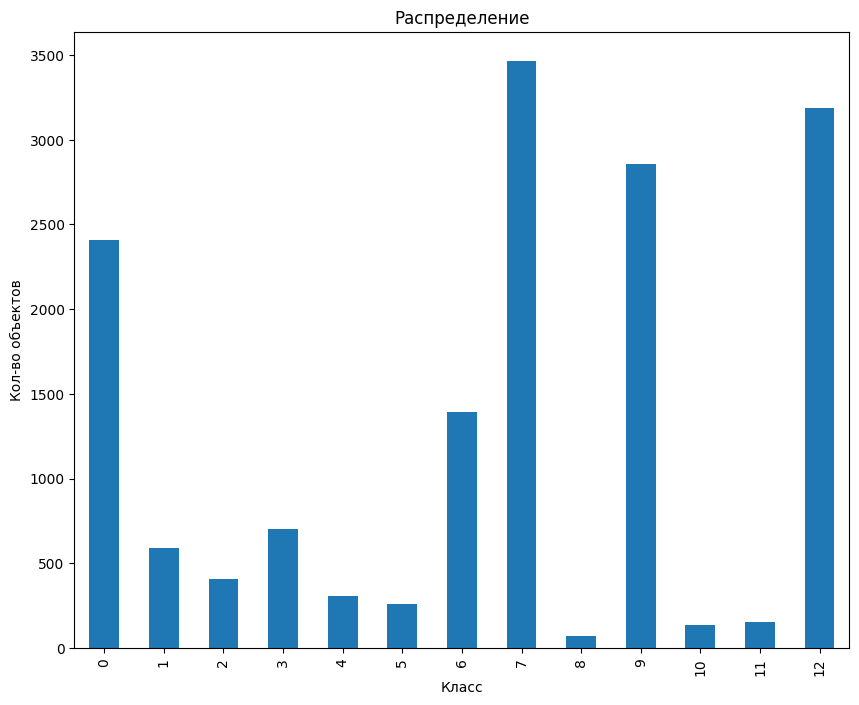

In [ ]:
plt.figure(figsize=(10, 8))
class_balance.plot(kind='bar')
plt.title('Распределение')
plt.xlabel('Класс')
plt.ylabel('Кол-во объектов')
plt.show()

Видим, что наблюдается сильный дисбаланс классов.

In [ ]:
with open('/content/names.txt') as file:
    classes = [row.strip() for row in file]
classes

['accessories',
 'bag',
 'belt',
 'dress',
 'glasses',
 'headwear',
 'outer',
 'pants',
 'scarf',
 'shoe',
 'shorts',
 'skirt',
 'top']

# Метрики

Буду использовать интегрированный в Yolo mAP50, confusion matrix

## Baseline

Разделим дату на тренировочную и тестовую (она же будет валидационной)

In [ ]:
images_dir = '/content/images'
labels_dir = '/content/labels'
train_images_dir = '/content/train/images'
train_labels_dir = '/content/train/labels'
test_images_dir = '/content/test/images'
test_labels_dir = '/content/test/labels'
test_size = 0.2

all_image_files = [os.path.join(images_dir, f) for f in os.listdir(images_dir) if os.path.isfile(os.path.join(images_dir, f))]

all_label_files = [os.path.join(labels_dir, os.path.splitext(os.path.basename(f))[0] + '.txt') for f in all_image_files]

train_images, test_images, train_labels, test_labels = train_test_split(all_image_files, all_label_files, test_size=test_size, random_state=42)

In [ ]:
def copy_files(file_list, destination):
    os.makedirs(destination, exist_ok=True)
    for file in file_list:
        shutil.copy(file, destination)

copy_files(train_images, train_images_dir)
copy_files(train_labels, train_labels_dir)

copy_files(test_images, test_images_dir)
copy_files(test_labels, test_labels_dir)

In [ ]:
data = {
  "train": "/content/train",
  "val": "/content/test",
  "nc": len(classes),
  "names": classes
}

with open("/content/data.yaml", "w") as file:
  yaml.dump(data, file)

In [ ]:
model = YOLO('yolov8m.pt')
model = model.to(device)

In [ ]:
res_train_base = model.train(data='/content/data.yaml', epochs=20, imgsz=640, cos_lr=True)

New https://pypi.org/project/ultralytics/8.2.57 available 😃 Update with 'pip install -U ultralytics'
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=Tru

train: Scanning /content/train/labels.cache... 3174 images, 44 backgrounds, 0 corrupt: 100%|██████████| 3174/3174 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /content/test/labels.cache... 794 images, 10 backgrounds, 0 corrupt: 100%|██████████| 794/794 [00:00<?, ?it/s]


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000588, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train4
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20       7.6G     0.8801      2.098      1.248         43        640: 100%|██████████| 199/199 [00:33<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:04<00:00,  5.64it/s]

                   all        794       3106      0.517      0.348      0.379      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      7.52G     0.8916       1.51      1.232         56        640: 100%|██████████| 199/199 [00:27<00:00,  7.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:04<00:00,  6.25it/s]


                   all        794       3106      0.568      0.422      0.424      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      7.57G     0.9313      1.513      1.256         57        640: 100%|██████████| 199/199 [00:26<00:00,  7.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:04<00:00,  5.91it/s]


                   all        794       3106      0.577      0.361      0.377      0.279

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      7.53G     0.9341      1.488      1.265         35        640: 100%|██████████| 199/199 [00:26<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.28it/s]


                   all        794       3106      0.541      0.361      0.413      0.302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      7.45G     0.8939      1.365      1.227         64        640: 100%|██████████| 199/199 [00:27<00:00,  7.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:04<00:00,  6.03it/s]


                   all        794       3106      0.559      0.445      0.463      0.357

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      7.54G     0.8637      1.297      1.212         62        640: 100%|██████████| 199/199 [00:26<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:04<00:00,  6.03it/s]


                   all        794       3106      0.511      0.486      0.497      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      7.56G     0.8189        1.2      1.182         43        640: 100%|██████████| 199/199 [00:26<00:00,  7.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.35it/s]


                   all        794       3106      0.612      0.517       0.54      0.426

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      7.58G     0.7936      1.127      1.172         42        640: 100%|██████████| 199/199 [00:26<00:00,  7.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:04<00:00,  6.02it/s]


                   all        794       3106      0.646      0.492      0.546      0.423

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      7.49G     0.7644      1.082      1.145         57        640: 100%|██████████| 199/199 [00:26<00:00,  7.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.33it/s]

                   all        794       3106        0.7      0.542      0.583      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      7.49G     0.7333      1.003      1.124         69        640: 100%|██████████| 199/199 [00:26<00:00,  7.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.27it/s]


                   all        794       3106        0.7      0.517       0.58      0.466
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20       7.5G      0.665     0.9194      1.061         27        640: 100%|██████████| 199/199 [00:29<00:00,  6.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.29it/s]


                   all        794       3106      0.693      0.553      0.608      0.495

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      7.58G     0.6337     0.8376      1.038         30        640: 100%|██████████| 199/199 [00:26<00:00,  7.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.29it/s]


                   all        794       3106      0.712      0.558      0.584      0.479

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      7.42G     0.6105      0.788       1.02         21        640: 100%|██████████| 199/199 [00:26<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:04<00:00,  6.08it/s]


                   all        794       3106       0.74      0.569      0.632      0.519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      7.51G     0.5785     0.7024      0.999         24        640: 100%|██████████| 199/199 [00:26<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.43it/s]

                   all        794       3106      0.688      0.604      0.635      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20       7.5G     0.5535     0.6543     0.9844         31        640: 100%|██████████| 199/199 [00:26<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:04<00:00,  6.14it/s]

                   all        794       3106      0.716      0.616       0.65      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      7.52G     0.5296     0.5902     0.9671         26        640: 100%|██████████| 199/199 [00:26<00:00,  7.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.43it/s]

                   all        794       3106      0.749      0.614      0.652      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      7.41G      0.512     0.5562     0.9529         27        640: 100%|██████████| 199/199 [00:26<00:00,  7.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.29it/s]

                   all        794       3106      0.716      0.621      0.657      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20       7.5G     0.4919     0.5135     0.9414         53        640: 100%|██████████| 199/199 [00:26<00:00,  7.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.28it/s]

                   all        794       3106      0.747      0.626       0.67      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      7.49G      0.482     0.4877     0.9365         17        640: 100%|██████████| 199/199 [00:26<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.42it/s]

                   all        794       3106      0.709      0.656      0.672      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      7.51G     0.4706     0.4678     0.9267         26        640: 100%|██████████| 199/199 [00:26<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:04<00:00,  6.16it/s]

                   all        794       3106      0.712      0.664      0.676      0.577



20 epochs completed in 0.199 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 52.0MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics YOLOv8.2.56 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,847,287 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:08<00:00,  3.00it/s]


                   all        794       3106      0.711      0.664      0.676      0.576
           accessories        237        472      0.724      0.487      0.521      0.308
                   bag         82        124      0.786      0.621      0.611       0.51
                  belt         45         71      0.564      0.563      0.533      0.382
                 dress        102        159       0.76      0.635      0.697      0.612
               glasses         47         57      0.918      0.737      0.811      0.633
              headwear         44         54      0.731      0.611      0.654      0.592
                 outer        146        284      0.639      0.587      0.647      0.541
                 pants        391        650      0.838       0.88      0.918      0.846
                 scarf          7          8      0.379      0.611      0.435      0.426
                  shoe        285        562      0.923      0.881      0.939      0.838
                short

In [ ]:
res_val_base = model.val(data='/content/data.yaml', imgsz=640)

100%|██████████| 49.7M/49.7M [00:00<00:00, 321MB/s]


YOLOv8m summary (fused): 218 layers, 25,886,080 parameters, 0 gradients, 78.9 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 23.8MB/s]
val: Scanning /content/test/labels... 794 images, 10 backgrounds, 0 corrupt: 100%|██████████| 794/794 [00:00<00:00, 1363.77it/s]

val: New cache created: /content/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:09<00:00,  5.45it/s]


                   all        794       3106     0.0181     0.0151    0.00954    0.00616
                person        237        472    0.00292     0.0148    0.00149   0.000867
               bicycle         82        124      0.102     0.0887     0.0555      0.036
                   car         45         71    0.00851     0.0282    0.00471    0.00471
            motorcycle        102        159          0          0          0          0
              airplane         47         57     0.0098     0.0175    0.00509    0.00509
                   bus         44         54          0          0          0          0
                 train        146        284          0          0          0          0
                 truck        391        650     0.0149    0.00154    0.00761    0.00152
                  boat          7          8          0          0          0          0
         traffic light        285        562     0.0606     0.0142     0.0313      0.029
          fire hydran

## Решение - беру YOLOv8m

In [ ]:
model = YOLO('yolov8m.pt')

In [ ]:
results = model.train(data='/content/data.yaml', epochs=200, imgsz=480, cos_lr=True)

Ultralytics YOLOv8.2.56 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/data.yaml, epochs=200, time=None, patience=100, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True,

train: Scanning /content/train/labels.cache... 3174 images, 44 backgrounds, 0 corrupt: 100%|██████████| 3174/3174 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /content/test/labels.cache... 794 images, 10 backgrounds, 0 corrupt: 100%|██████████| 794/794 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000588, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 480 train, 480 val
Using 8 dataloader workers
Logging results to runs/detect/train2
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      5.35G     0.7601      1.177       1.12         43        480: 100%|██████████| 199/199 [00:26<00:00,  7.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.87it/s]


                   all        794       3106      0.528      0.469      0.461      0.357

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200       5.1G      0.813      1.237      1.161         56        480: 100%|██████████| 199/199 [00:23<00:00,  8.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.93it/s]


                   all        794       3106      0.466      0.394      0.403      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200       5.1G     0.9028       1.39      1.211         56        480: 100%|██████████| 199/199 [00:22<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.94it/s]


                   all        794       3106      0.545      0.402      0.395      0.292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200       5.1G      0.932      1.421      1.239         33        480: 100%|██████████| 199/199 [00:21<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.89it/s]


                   all        794       3106      0.596      0.414      0.441       0.32

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200         5G     0.8963       1.31      1.212         64        480: 100%|██████████| 199/199 [00:21<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.14it/s]


                   all        794       3106      0.586      0.419      0.436      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      5.08G     0.8804      1.276      1.202         62        480: 100%|██████████| 199/199 [00:21<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.73it/s]


                   all        794       3106      0.599      0.495       0.53      0.414

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      5.05G     0.8602      1.221      1.188         43        480: 100%|██████████| 199/199 [00:22<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.20it/s]

                   all        794       3106      0.634      0.497      0.523      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      5.11G     0.8501      1.193      1.189         42        480: 100%|██████████| 199/199 [00:21<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.91it/s]


                   all        794       3106      0.632      0.504      0.532      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200         5G     0.8293       1.14      1.163         57        480: 100%|██████████| 199/199 [00:21<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.73it/s]


                   all        794       3106        0.6      0.505      0.538      0.421

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      5.08G     0.8132       1.09      1.156         68        480: 100%|██████████| 199/199 [00:21<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.20it/s]


                   all        794       3106      0.593      0.482      0.518      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      5.06G     0.8073      1.092      1.152         45        480: 100%|██████████| 199/199 [00:21<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.68it/s]

                   all        794       3106      0.584      0.542      0.548      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      5.11G     0.7773      1.018      1.137         50        480: 100%|██████████| 199/199 [00:21<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.03it/s]


                   all        794       3106      0.658      0.533      0.568      0.455

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200         5G     0.7796      1.007      1.134         42        480: 100%|██████████| 199/199 [00:21<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.11it/s]

                   all        794       3106      0.627      0.538      0.561      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      5.07G     0.7728      1.012      1.137         74        480: 100%|██████████| 199/199 [00:21<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.00it/s]

                   all        794       3106      0.645       0.52      0.571      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      5.06G     0.7529     0.9612      1.119         45        480: 100%|██████████| 199/199 [00:21<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.11it/s]

                   all        794       3106       0.67      0.555       0.59      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200       5.1G     0.7523      0.951      1.116         34        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.89it/s]


                   all        794       3106      0.659        0.5      0.553      0.449

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200         5G     0.7435     0.9452      1.108         46        480: 100%|██████████| 199/199 [00:21<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.06it/s]

                   all        794       3106      0.649      0.528      0.552      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      5.08G     0.7367     0.9337      1.105         56        480: 100%|██████████| 199/199 [00:21<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.10it/s]

                   all        794       3106      0.684      0.507      0.576      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      5.06G     0.7162       0.89      1.092         58        480: 100%|██████████| 199/199 [00:21<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.88it/s]

                   all        794       3106      0.677      0.547      0.588      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200       5.1G     0.7184     0.8809      1.085         37        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.09it/s]

                   all        794       3106      0.626      0.557      0.564      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200         5G     0.7116     0.8845       1.09         51        480: 100%|██████████| 199/199 [00:21<00:00,  9.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.73it/s]

                   all        794       3106      0.659      0.547      0.575      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      5.08G     0.7185     0.8828      1.097         52        480: 100%|██████████| 199/199 [00:21<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.17it/s]

                   all        794       3106      0.649      0.522      0.578      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      5.06G     0.6968     0.8256      1.079         76        480: 100%|██████████| 199/199 [00:21<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.17it/s]

                   all        794       3106      0.652      0.578      0.593      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200       5.1G     0.6967     0.8225      1.078         41        480: 100%|██████████| 199/199 [00:22<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.75it/s]

                   all        794       3106      0.673      0.573      0.592      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200         5G     0.6916     0.8203      1.082         52        480: 100%|██████████| 199/199 [00:21<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.14it/s]

                   all        794       3106      0.698      0.567      0.611      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      5.07G     0.6845     0.8025      1.074         41        480: 100%|██████████| 199/199 [00:21<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.91it/s]

                   all        794       3106      0.662      0.594      0.611      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      5.06G     0.6795     0.8023      1.074         34        480: 100%|██████████| 199/199 [00:22<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.13it/s]

                   all        794       3106      0.715      0.546      0.609      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      5.11G     0.6842     0.7858      1.071         29        480: 100%|██████████| 199/199 [00:21<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.14it/s]

                   all        794       3106      0.697       0.58      0.635      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200         5G     0.6685     0.7696      1.062         44        480: 100%|██████████| 199/199 [00:21<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.65it/s]

                   all        794       3106      0.667      0.575       0.61      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      5.08G     0.6638     0.7567      1.063         29        480: 100%|██████████| 199/199 [00:21<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.20it/s]

                   all        794       3106      0.703      0.562      0.614        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      5.07G     0.6619     0.7396      1.058         39        480: 100%|██████████| 199/199 [00:21<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.91it/s]

                   all        794       3106      0.708      0.579      0.634      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      5.09G     0.6568     0.7358      1.048         45        480: 100%|██████████| 199/199 [00:22<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.13it/s]

                   all        794       3106      0.667      0.585      0.606      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200         5G     0.6523     0.7152      1.048         41        480: 100%|██████████| 199/199 [00:21<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.13it/s]

                   all        794       3106      0.664      0.558      0.611      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      5.08G     0.6518     0.7189      1.045         57        480: 100%|██████████| 199/199 [00:22<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.78it/s]

                   all        794       3106      0.686      0.592      0.621      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      5.05G     0.6572      0.728      1.056         40        480: 100%|██████████| 199/199 [00:21<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.26it/s]

                   all        794       3106      0.695      0.575      0.614      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200       5.1G     0.6491     0.7085      1.045         47        480: 100%|██████████| 199/199 [00:21<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.86it/s]

                   all        794       3106      0.725      0.562      0.629      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200         5G     0.6441     0.6933      1.047         19        480: 100%|██████████| 199/199 [00:22<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.13it/s]

                   all        794       3106      0.672      0.617      0.635      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      5.08G     0.6419     0.6937      1.041         36        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.17it/s]

                   all        794       3106      0.662      0.619      0.637      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      5.06G     0.6385     0.6675      1.043         54        480: 100%|██████████| 199/199 [00:22<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.77it/s]

                   all        794       3106      0.745      0.559      0.622      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200       5.1G     0.6321     0.6616      1.036         34        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.21it/s]

                   all        794       3106      0.684      0.612      0.632      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200         5G      0.638      0.671      1.041         43        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.87it/s]

                   all        794       3106      0.699      0.607       0.64      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      5.07G     0.6322     0.6584      1.035         56        480: 100%|██████████| 199/199 [00:21<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.14it/s]

                   all        794       3106      0.668        0.6      0.628       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      5.06G     0.6194     0.6504      1.029         40        480: 100%|██████████| 199/199 [00:21<00:00,  9.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.15it/s]

                   all        794       3106      0.722      0.588      0.641      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      5.11G     0.6245     0.6424      1.033         24        480: 100%|██████████| 199/199 [00:21<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.86it/s]

                   all        794       3106      0.713      0.586      0.636      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200         5G     0.6191     0.6394      1.031         58        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.28it/s]

                   all        794       3106      0.748      0.597       0.65      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      5.07G      0.619     0.6307       1.03         47        480: 100%|██████████| 199/199 [00:21<00:00,  9.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.91it/s]

                   all        794       3106      0.662      0.624      0.636      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      5.05G     0.6079     0.6247      1.022         43        480: 100%|██████████| 199/199 [00:22<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.07it/s]

                   all        794       3106      0.671      0.598      0.625       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200       5.1G     0.6062     0.6188      1.025         49        480: 100%|██████████| 199/199 [00:21<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.21it/s]

                   all        794       3106      0.715      0.575      0.627       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200         5G     0.6015     0.6016       1.02         46        480: 100%|██████████| 199/199 [00:21<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.82it/s]

                   all        794       3106      0.659      0.584      0.629      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      5.06G     0.6083     0.6197      1.022         84        480: 100%|██████████| 199/199 [00:21<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.25it/s]

                   all        794       3106      0.712      0.596      0.644      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      5.05G     0.5916     0.5854       1.01         45        480: 100%|██████████| 199/199 [00:21<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.03it/s]


                   all        794       3106      0.765       0.59      0.665      0.553

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200       5.1G     0.5949     0.6039      1.017         63        480: 100%|██████████| 199/199 [00:22<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.02it/s]

                   all        794       3106      0.753      0.591      0.661      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      4.99G     0.5941     0.5862      1.013         67        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.25it/s]

                   all        794       3106      0.721      0.604      0.654      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      5.07G     0.5993      0.592      1.016         50        480: 100%|██████████| 199/199 [00:21<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.02it/s]

                   all        794       3106      0.761      0.568      0.628      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      5.07G     0.5958     0.5787      1.016         35        480: 100%|██████████| 199/199 [00:21<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.31it/s]

                   all        794       3106      0.669      0.599      0.636      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      5.11G     0.5922     0.5788      1.012         62        480: 100%|██████████| 199/199 [00:21<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.13it/s]

                   all        794       3106      0.778      0.582      0.655      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200         5G     0.5845     0.5692      1.009         43        480: 100%|██████████| 199/199 [00:22<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.02it/s]

                   all        794       3106      0.676      0.636      0.651      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      5.06G     0.5832     0.5639      1.009         60        480: 100%|██████████| 199/199 [00:21<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.21it/s]

                   all        794       3106      0.735      0.589      0.637      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      5.05G       0.58     0.5534      1.005         48        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.81it/s]

                   all        794       3106      0.667      0.636       0.64      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      5.09G     0.5793     0.5459      1.005         50        480: 100%|██████████| 199/199 [00:21<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.29it/s]

                   all        794       3106      0.764       0.58      0.658      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200         5G     0.5738     0.5537     0.9996         46        480: 100%|██████████| 199/199 [00:21<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.11it/s]

                   all        794       3106      0.691      0.619      0.645       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      5.06G     0.5697     0.5417      1.002         43        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.94it/s]

                   all        794       3106      0.732      0.599      0.647       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      5.05G     0.5685       0.54      1.003         40        480: 100%|██████████| 199/199 [00:22<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.30it/s]

                   all        794       3106      0.725      0.604      0.664      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200       5.1G     0.5625     0.5303     0.9891         72        480: 100%|██████████| 199/199 [00:21<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.59it/s]

                   all        794       3106      0.672      0.621      0.643      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200         5G     0.5628     0.5247     0.9963         31        480: 100%|██████████| 199/199 [00:21<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.31it/s]

                   all        794       3106      0.778       0.59      0.651      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      5.06G     0.5588     0.5273     0.9963         57        480: 100%|██████████| 199/199 [00:21<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.23it/s]

                   all        794       3106      0.762      0.608      0.661       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      5.06G     0.5574     0.5152     0.9932         32        480: 100%|██████████| 199/199 [00:22<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.91it/s]

                   all        794       3106      0.786      0.576      0.655      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      5.11G     0.5553     0.5148     0.9929         49        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.34it/s]

                   all        794       3106       0.76      0.578      0.656      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200         5G      0.556     0.5125     0.9893         67        480: 100%|██████████| 199/199 [00:21<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.76it/s]

                   all        794       3106      0.805      0.553      0.649      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      5.07G     0.5526      0.512     0.9954         86        480: 100%|██████████| 199/199 [00:21<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.25it/s]

                   all        794       3106       0.75       0.57      0.649      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      5.04G     0.5424     0.4976      0.983         40        480: 100%|██████████| 199/199 [00:21<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.33it/s]

                   all        794       3106      0.761      0.589      0.646      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200       5.1G     0.5493     0.5005     0.9899         38        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.03it/s]

                   all        794       3106       0.73      0.603      0.663      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200         5G      0.546     0.4924      0.984         63        480: 100%|██████████| 199/199 [00:21<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.39it/s]

                   all        794       3106      0.738      0.584      0.638      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      5.07G     0.5465     0.5021     0.9874         28        480: 100%|██████████| 199/199 [00:21<00:00,  9.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.94it/s]

                   all        794       3106      0.759      0.606       0.66      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      5.05G     0.5437     0.4906     0.9866         61        480: 100%|██████████| 199/199 [00:22<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.14it/s]

                   all        794       3106      0.752      0.586      0.645      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200       5.1G      0.543     0.4904     0.9814         48        480: 100%|██████████| 199/199 [00:21<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.27it/s]

                   all        794       3106      0.748      0.624      0.672       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200         5G     0.5436     0.4895      0.986         52        480: 100%|██████████| 199/199 [00:21<00:00,  9.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.86it/s]

                   all        794       3106      0.711      0.636      0.661      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      5.07G     0.5384     0.4827     0.9802         31        480: 100%|██████████| 199/199 [00:21<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.30it/s]

                   all        794       3106       0.75      0.581       0.65      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      5.06G     0.5362     0.4816     0.9767         57        480: 100%|██████████| 199/199 [00:21<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.98it/s]

                   all        794       3106      0.764      0.604      0.662      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200       5.1G      0.525      0.462     0.9716         47        480: 100%|██████████| 199/199 [00:22<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.91it/s]

                   all        794       3106      0.717      0.593      0.638      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200         5G     0.5325     0.4785      0.977         24        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.29it/s]

                   all        794       3106      0.728      0.612      0.651      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      5.06G     0.5279     0.4665     0.9733         68        480: 100%|██████████| 199/199 [00:21<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.03it/s]

                   all        794       3106      0.699      0.644      0.672      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      5.06G     0.5248     0.4645     0.9744         60        480: 100%|██████████| 199/199 [00:21<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.16it/s]

                   all        794       3106      0.713      0.638      0.664      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200       5.1G     0.5238     0.4622     0.9679         67        480: 100%|██████████| 199/199 [00:22<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.31it/s]

                   all        794       3106      0.755      0.595      0.657      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200         5G     0.5258     0.4678     0.9741         49        480: 100%|██████████| 199/199 [00:21<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.84it/s]

                   all        794       3106      0.766      0.605      0.658      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      5.07G      0.522     0.4584     0.9695         45        480: 100%|██████████| 199/199 [00:21<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.45it/s]

                   all        794       3106      0.738      0.608       0.65      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      5.06G     0.5291     0.4614     0.9759         26        480: 100%|██████████| 199/199 [00:21<00:00,  9.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.90it/s]

                   all        794       3106      0.787      0.587       0.66      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200       5.1G     0.5162     0.4466     0.9678         56        480: 100%|██████████| 199/199 [00:22<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.98it/s]

                   all        794       3106      0.731      0.613      0.659      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200         5G     0.5156     0.4552      0.969         37        480: 100%|██████████| 199/199 [00:21<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.29it/s]

                   all        794       3106      0.733      0.622      0.657      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      5.08G     0.5149     0.4438     0.9666         47        480: 100%|██████████| 199/199 [00:22<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.98it/s]

                   all        794       3106      0.786      0.599      0.659      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      5.05G     0.5085     0.4454     0.9666         39        480: 100%|██████████| 199/199 [00:22<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.22it/s]

                   all        794       3106       0.74      0.617      0.665      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200       5.1G     0.5111     0.4384     0.9674         42        480: 100%|██████████| 199/199 [00:22<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.03it/s]

                   all        794       3106      0.762      0.616      0.667      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      4.99G      0.505     0.4324     0.9653         44        480: 100%|██████████| 199/199 [00:22<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.09it/s]

                   all        794       3106      0.777      0.588      0.645      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      5.06G     0.5087     0.4306     0.9659         51        480: 100%|██████████| 199/199 [00:21<00:00,  9.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.31it/s]

                   all        794       3106      0.749      0.616      0.661      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      5.05G      0.505      0.427     0.9628         45        480: 100%|██████████| 199/199 [00:21<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.99it/s]

                   all        794       3106      0.763      0.589      0.654      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      5.09G     0.5066     0.4307     0.9672         58        480: 100%|██████████| 199/199 [00:21<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.34it/s]

                   all        794       3106      0.721      0.618       0.66      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      4.99G     0.5071     0.4279     0.9608         38        480: 100%|██████████| 199/199 [00:21<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.30it/s]

                   all        794       3106      0.732      0.599       0.66      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      5.06G     0.5019     0.4286     0.9595         29        480: 100%|██████████| 199/199 [00:21<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.98it/s]

                   all        794       3106      0.754      0.604       0.66      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      5.06G     0.4942     0.4141     0.9582         31        480: 100%|██████████| 199/199 [00:21<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.33it/s]

                   all        794       3106      0.742      0.604      0.666      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200       5.1G     0.4931     0.4165     0.9548         32        480: 100%|██████████| 199/199 [00:21<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.02it/s]

                   all        794       3106      0.691      0.635      0.663      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200         5G     0.4952     0.4111     0.9545         34        480: 100%|██████████| 199/199 [00:22<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.17it/s]

                   all        794       3106      0.765      0.604       0.67      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      5.08G     0.4936     0.4142      0.957         33        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.43it/s]

                   all        794       3106      0.725      0.641      0.674      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      5.05G     0.4868     0.4125     0.9578         43        480: 100%|██████████| 199/199 [00:22<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.80it/s]

                   all        794       3106      0.741       0.64      0.684      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200       5.1G     0.4912     0.4109     0.9546         71        480: 100%|██████████| 199/199 [00:21<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.29it/s]

                   all        794       3106      0.781      0.618      0.677      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200         5G     0.4879     0.4029     0.9553         28        480: 100%|██████████| 199/199 [00:21<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.01it/s]

                   all        794       3106      0.771      0.619      0.672      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      5.06G     0.4901     0.4038     0.9557         36        480: 100%|██████████| 199/199 [00:22<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.28it/s]

                   all        794       3106      0.715      0.624      0.659      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      5.05G     0.4869     0.4055     0.9563         50        480: 100%|██████████| 199/199 [00:21<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.45it/s]

                   all        794       3106      0.711      0.637      0.666      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200       5.1G     0.4814     0.3981     0.9472         59        480: 100%|██████████| 199/199 [00:21<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.11it/s]

                   all        794       3106      0.745      0.621       0.68      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200         5G     0.4772     0.3971     0.9473         54        480: 100%|██████████| 199/199 [00:21<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.40it/s]

                   all        794       3106      0.761      0.611      0.669      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      5.07G     0.4764     0.3893     0.9488         48        480: 100%|██████████| 199/199 [00:21<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.05it/s]

                   all        794       3106      0.706      0.636      0.671      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      5.05G     0.4786     0.3961     0.9491         29        480: 100%|██████████| 199/199 [00:21<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.27it/s]

                   all        794       3106      0.716      0.636      0.668      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      5.09G     0.4764     0.3883     0.9465         38        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.08it/s]

                   all        794       3106      0.751      0.624      0.671      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200         5G      0.468     0.3806     0.9447         26        480: 100%|██████████| 199/199 [00:22<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.66it/s]

                   all        794       3106      0.734      0.626      0.667      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      5.06G     0.4721     0.3882      0.946         22        480: 100%|██████████| 199/199 [00:21<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.33it/s]

                   all        794       3106      0.732       0.61      0.666       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      5.07G     0.4717     0.3812     0.9447         31        480: 100%|██████████| 199/199 [00:21<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.13it/s]

                   all        794       3106       0.72      0.626      0.671      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200       5.1G     0.4718     0.3805      0.951         51        480: 100%|██████████| 199/199 [00:21<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.05it/s]

                   all        794       3106      0.784      0.607      0.672      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      4.99G     0.4748     0.3873     0.9475         61        480: 100%|██████████| 199/199 [00:21<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.43it/s]

                   all        794       3106      0.744      0.609      0.665      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      5.07G     0.4669     0.3772     0.9442         46        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.99it/s]

                   all        794       3106      0.709      0.633      0.674      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      5.05G     0.4634     0.3663      0.939         56        480: 100%|██████████| 199/199 [00:22<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.29it/s]

                   all        794       3106       0.75      0.621      0.672      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      5.09G     0.4555     0.3647     0.9363         69        480: 100%|██████████| 199/199 [00:21<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.06it/s]

                   all        794       3106       0.76      0.609      0.671       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200         5G     0.4643     0.3701      0.941         58        480: 100%|██████████| 199/199 [00:22<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.14it/s]

                   all        794       3106      0.748      0.616      0.675      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      5.07G     0.4602     0.3666     0.9441         37        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.38it/s]

                   all        794       3106      0.799      0.585      0.678      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      5.05G     0.4636      0.367     0.9422         36        480: 100%|██████████| 199/199 [00:21<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.96it/s]

                   all        794       3106      0.704      0.637      0.675      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200       5.1G     0.4551     0.3619     0.9365         64        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.31it/s]

                   all        794       3106      0.783      0.607      0.674       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200         5G     0.4563     0.3593     0.9343         41        480: 100%|██████████| 199/199 [00:21<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.00it/s]

                   all        794       3106      0.765      0.618      0.679       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      5.06G     0.4549     0.3605     0.9376         37        480: 100%|██████████| 199/199 [00:22<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.17it/s]

                   all        794       3106      0.774      0.614      0.681      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      5.06G     0.4526     0.3571     0.9362         37        480: 100%|██████████| 199/199 [00:21<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.30it/s]

                   all        794       3106      0.768       0.64      0.684      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200       5.1G     0.4558      0.356     0.9345         39        480: 100%|██████████| 199/199 [00:21<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.84it/s]

                   all        794       3106      0.773      0.634      0.684      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200         5G     0.4487     0.3591     0.9372         40        480: 100%|██████████| 199/199 [00:21<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.27it/s]

                   all        794       3106      0.741      0.649       0.68      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      5.06G     0.4496     0.3476     0.9296         56        480: 100%|██████████| 199/199 [00:21<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.42it/s]

                   all        794       3106      0.771      0.618      0.669      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      5.06G     0.4448      0.349     0.9336         50        480: 100%|██████████| 199/199 [00:21<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.15it/s]

                   all        794       3106      0.744      0.638      0.673      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      5.08G     0.4493     0.3568     0.9383         35        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.27it/s]

                   all        794       3106      0.773      0.612       0.67      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200         5G     0.4489     0.3473      0.933         61        480: 100%|██████████| 199/199 [00:22<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.00it/s]

                   all        794       3106      0.785      0.597      0.669      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      5.07G     0.4337     0.3396     0.9291         50        480: 100%|██████████| 199/199 [00:22<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.29it/s]

                   all        794       3106      0.778      0.623      0.678      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      5.05G     0.4396     0.3446      0.932         65        480: 100%|██████████| 199/199 [00:22<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.31it/s]

                   all        794       3106      0.766      0.624      0.677      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200       5.1G     0.4357     0.3386     0.9282         47        480: 100%|██████████| 199/199 [00:22<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.79it/s]

                   all        794       3106      0.796      0.612      0.678      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200         5G     0.4374      0.338     0.9292         52        480: 100%|██████████| 199/199 [00:21<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.30it/s]

                   all        794       3106      0.754      0.633      0.672       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      5.06G     0.4375     0.3423     0.9313         32        480: 100%|██████████| 199/199 [00:22<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.06it/s]

                   all        794       3106      0.757      0.634      0.667      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      5.05G     0.4318     0.3341     0.9305         62        480: 100%|██████████| 199/199 [00:22<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.26it/s]

                   all        794       3106      0.762      0.612      0.664      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200       5.1G     0.4387     0.3401     0.9336         55        480: 100%|██████████| 199/199 [00:21<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.27it/s]

                   all        794       3106      0.778       0.62      0.669      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      4.99G     0.4315      0.334     0.9272         36        480: 100%|██████████| 199/199 [00:22<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.96it/s]

                   all        794       3106      0.787       0.61       0.67      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      5.06G     0.4281     0.3323     0.9253         40        480: 100%|██████████| 199/199 [00:21<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.28it/s]

                   all        794       3106      0.734       0.65      0.674      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      5.06G     0.4283     0.3323     0.9226         40        480: 100%|██████████| 199/199 [00:21<00:00,  9.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.88it/s]

                   all        794       3106      0.787       0.62      0.667       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      5.11G     0.4343      0.338     0.9325         50        480: 100%|██████████| 199/199 [00:22<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.22it/s]

                   all        794       3106      0.788      0.613      0.666      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200         5G     0.4297     0.3337      0.931         65        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.25it/s]

                   all        794       3106      0.797      0.614      0.671      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      5.07G     0.4244      0.325     0.9226         37        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.00it/s]

                   all        794       3106      0.791      0.609      0.675      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      5.05G     0.4234      0.326      0.924         39        480: 100%|██████████| 199/199 [00:22<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.32it/s]

                   all        794       3106      0.746      0.637      0.671      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200       5.1G      0.425     0.3274     0.9274         54        480: 100%|██████████| 199/199 [00:22<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.76it/s]

                   all        794       3106      0.753       0.62      0.668      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      4.99G     0.4239     0.3221     0.9234         42        480: 100%|██████████| 199/199 [00:22<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.15it/s]

                   all        794       3106      0.751      0.625      0.672      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      5.08G     0.4226     0.3255     0.9194         47        480: 100%|██████████| 199/199 [00:21<00:00,  9.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.39it/s]

                   all        794       3106      0.767      0.622      0.676      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      5.06G       0.42      0.317     0.9245         50        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.85it/s]

                   all        794       3106      0.771      0.624      0.673      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200       5.1G     0.4234      0.321     0.9226         55        480: 100%|██████████| 199/199 [00:21<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.31it/s]

                   all        794       3106      0.783      0.622      0.675      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      4.99G     0.4171     0.3165     0.9221         58        480: 100%|██████████| 199/199 [00:21<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.07it/s]

                   all        794       3106      0.787      0.617      0.669      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200      5.06G     0.4169     0.3146     0.9192         26        480: 100%|██████████| 199/199 [00:22<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.06it/s]

                   all        794       3106      0.776       0.62      0.668      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200      5.05G     0.4163     0.3158     0.9167         57        480: 100%|██████████| 199/199 [00:21<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.36it/s]

                   all        794       3106      0.774      0.619      0.665      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200       5.1G     0.4157     0.3124     0.9175         57        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.91it/s]

                   all        794       3106      0.774      0.615      0.665      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200         5G     0.4083     0.3073     0.9159         48        480: 100%|██████████| 199/199 [00:21<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.33it/s]

                   all        794       3106      0.762      0.624      0.671      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      5.06G     0.4133     0.3109      0.914         43        480: 100%|██████████| 199/199 [00:21<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.36it/s]

                   all        794       3106      0.779      0.618      0.673       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200      5.05G      0.407     0.3059     0.9159         51        480: 100%|██████████| 199/199 [00:22<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.11it/s]

                   all        794       3106       0.78      0.621      0.676      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      5.09G     0.4051     0.3058     0.9157         50        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.39it/s]

                   all        794       3106      0.783      0.618      0.674      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200         5G     0.4098     0.3106     0.9185         51        480: 100%|██████████| 199/199 [00:21<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.76it/s]

                   all        794       3106      0.786      0.611      0.674       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      5.07G     0.4071     0.3072     0.9159         71        480: 100%|██████████| 199/199 [00:21<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.21it/s]

                   all        794       3106      0.766      0.618      0.678      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      5.06G      0.407     0.3059     0.9184         51        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.36it/s]

                   all        794       3106      0.749      0.628      0.676      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200       5.1G     0.4077     0.3117     0.9203         46        480: 100%|██████████| 199/199 [00:22<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.06it/s]

                   all        794       3106      0.776       0.62      0.679      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200         5G     0.4005     0.2985     0.9138         49        480: 100%|██████████| 199/199 [00:21<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.26it/s]

                   all        794       3106      0.769      0.618      0.676      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      5.06G     0.4081     0.3106     0.9193         73        480: 100%|██████████| 199/199 [00:21<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.34it/s]

                   all        794       3106      0.765      0.617      0.679      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200      5.06G     0.4033     0.3041     0.9161         37        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.06it/s]

                   all        794       3106      0.785      0.615      0.681      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      5.09G      0.403     0.3042      0.913         54        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.36it/s]

                   all        794       3106      0.773      0.618      0.682      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200         5G     0.3994     0.3019     0.9158         48        480: 100%|██████████| 199/199 [00:21<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.02it/s]

                   all        794       3106      0.771      0.623      0.681      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      5.07G     0.3938     0.2966     0.9134         32        480: 100%|██████████| 199/199 [00:22<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.37it/s]

                   all        794       3106      0.772      0.624      0.681      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200      5.05G     0.4028     0.3028     0.9122         64        480: 100%|██████████| 199/199 [00:21<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.27it/s]

                   all        794       3106      0.781      0.619      0.677      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200       5.1G     0.3977     0.2975     0.9096         66        480: 100%|██████████| 199/199 [00:22<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.05it/s]

                   all        794       3106      0.779      0.616      0.677      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200         5G     0.4005      0.299     0.9141         44        480: 100%|██████████| 199/199 [00:22<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.32it/s]

                   all        794       3106      0.766      0.621      0.674      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200      5.07G     0.4022     0.3015     0.9119         51        480: 100%|██████████| 199/199 [00:21<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.15it/s]

                   all        794       3106      0.775      0.618      0.674      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      5.05G     0.3984     0.2957     0.9086         67        480: 100%|██████████| 199/199 [00:22<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.29it/s]

                   all        794       3106      0.785      0.618      0.674      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200      5.09G     0.4009     0.2996     0.9136         52        480: 100%|██████████| 199/199 [00:21<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.40it/s]

                   all        794       3106      0.782      0.617      0.675      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200         5G      0.402     0.3037      0.918         28        480: 100%|██████████| 199/199 [00:22<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.89it/s]

                   all        794       3106      0.778       0.62      0.673      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      5.06G     0.3959      0.298     0.9134         52        480: 100%|██████████| 199/199 [00:21<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.25it/s]

                   all        794       3106      0.784      0.609      0.675      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200      5.12G     0.3968     0.2973     0.9119         55        480: 100%|██████████| 199/199 [00:22<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.01it/s]

                   all        794       3106       0.78      0.611      0.674      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200       5.1G     0.3936     0.2926     0.9086         65        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.21it/s]

                   all        794       3106      0.806      0.599      0.673      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      4.99G     0.4032     0.3036     0.9163         59        480: 100%|██████████| 199/199 [00:21<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.38it/s]

                   all        794       3106      0.776      0.617      0.673      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      5.07G     0.3933     0.2945     0.9094         48        480: 100%|██████████| 199/199 [00:21<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.96it/s]

                   all        794       3106      0.765      0.624      0.673      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      5.07G     0.3965     0.2937     0.9114         34        480: 100%|██████████| 199/199 [00:21<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.37it/s]

                   all        794       3106      0.763      0.628      0.675      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200       5.1G     0.3939     0.2956     0.9102         68        480: 100%|██████████| 199/199 [00:21<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.13it/s]

                   all        794       3106      0.765      0.625      0.675      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200         5G     0.3933     0.2932     0.9109         33        480: 100%|██████████| 199/199 [00:22<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.11it/s]

                   all        794       3106      0.776      0.617      0.676      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      5.07G     0.3908     0.2916     0.9086         54        480: 100%|██████████| 199/199 [00:22<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.21it/s]

                   all        794       3106       0.78      0.615      0.676      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200      5.06G     0.3963      0.292     0.9149         79        480: 100%|██████████| 199/199 [00:21<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.75it/s]

                   all        794       3106      0.767      0.621      0.676      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      5.09G     0.3966     0.2916      0.911         48        480: 100%|██████████| 199/199 [00:22<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.35it/s]

                   all        794       3106      0.766      0.623      0.676      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      4.99G      0.394      0.291     0.9077         49        480: 100%|██████████| 199/199 [00:21<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.16it/s]

                   all        794       3106      0.763      0.622      0.676      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      5.06G     0.3902     0.2919     0.9096         68        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.10it/s]

                   all        794       3106      0.794      0.607      0.676      0.577


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      5.06G     0.3197     0.2154     0.8298         21        480: 100%|██████████| 199/199 [00:23<00:00,  8.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.24it/s]

                   all        794       3106      0.781       0.61       0.67      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200       5.1G     0.3207     0.2111     0.8326         19        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.05it/s]

                   all        794       3106      0.784      0.604      0.666      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      4.99G     0.3124     0.2078     0.8274         37        480: 100%|██████████| 199/199 [00:21<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.36it/s]

                   all        794       3106      0.801      0.594      0.664       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      5.07G     0.3123     0.2053      0.829         35        480: 100%|██████████| 199/199 [00:21<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.91it/s]

                   all        794       3106      0.798      0.592      0.664      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200      5.05G     0.3123     0.2065     0.8303         19        480: 100%|██████████| 199/199 [00:22<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.22it/s]

                   all        794       3106      0.792      0.596      0.663      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      5.09G     0.3173     0.2085     0.8315         26        480: 100%|██████████| 199/199 [00:21<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.27it/s]

                   all        794       3106      0.785      0.601      0.662      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200         5G     0.3125     0.2031     0.8282          7        480: 100%|██████████| 199/199 [00:21<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.03it/s]

                   all        794       3106      0.789      0.597      0.662      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      5.07G     0.3123     0.2052     0.8295         15        480: 100%|██████████| 199/199 [00:21<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.29it/s]

                   all        794       3106      0.802      0.593      0.662      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      5.06G     0.3111     0.2019     0.8297         20        480: 100%|██████████| 199/199 [00:21<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  6.96it/s]

                   all        794       3106      0.796      0.597      0.662      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      5.11G     0.3067      0.201     0.8271         26        480: 100%|██████████| 199/199 [00:21<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:03<00:00,  7.19it/s]

                   all        794       3106        0.8      0.597      0.662       0.56



200 epochs completed in 1.482 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 52.0MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.2.56 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,847,287 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:07<00:00,  3.35it/s]


                   all        794       3106       0.77      0.635      0.683      0.583
           accessories        237        472      0.769      0.403      0.466      0.271
                   bag         82        124      0.843      0.605      0.635      0.534
                  belt         45         71       0.69      0.521      0.587      0.432
                 dress        102        159      0.821      0.606      0.711      0.626
               glasses         47         57      0.839      0.719      0.763      0.626
              headwear         44         54      0.754      0.566       0.64       0.57
                 outer        146        284      0.739      0.595      0.635      0.528
                 pants        391        650      0.886      0.862      0.908      0.834
                 scarf          7          8       0.62       0.75      0.655       0.59
                  shoe        285        562      0.915      0.893      0.934      0.839
                short

In [ ]:
model = YOLO('/content/runs/detect/train2/weights/best.pt')

In [ ]:
res_val = model.val(data='/content/data.yaml', imgsz=640)

Ultralytics YOLOv8.2.56 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,847,287 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/test/labels.cache... 794 images, 10 backgrounds, 0 corrupt: 100%|██████████| 794/794 [00:00<?, ?it/s]
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:08<00:00,  5.64it/s]


                   all        794       3106      0.768      0.609       0.67      0.568
           accessories        237        472      0.782      0.432      0.554      0.327
                   bag         82        124      0.787      0.548      0.587      0.457
                  belt         45         71      0.713      0.507      0.514      0.377
                 dress        102        159      0.782      0.579       0.67      0.578
               glasses         47         57      0.911      0.737      0.799      0.653
              headwear         44         54      0.746      0.556      0.653      0.585
                 outer        146        284      0.744      0.562      0.634      0.526
                 pants        391        650      0.914      0.858      0.908      0.832
                 scarf          7          8        0.5        0.5      0.529      0.491
                  shoe        285        562      0.928      0.881      0.938      0.849
                short

## Оценка результата

In [ ]:
metrics = model.val()
print(metrics)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

In [ ]:
def draw_boxes(image, results):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    ax = plt.gca()

    for result in results[0].boxes:
        x1, y1, x2, y2 = result.xyxy[0].cpu().numpy()
        label = model.names[int(result.cls)]
        score = result.conf.cpu().item()

        rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, color='red', linewidth=2)
        ax.add_patch(rect)
        plt.text(x1, y1, f'{label} {score:.2f}', color='white', fontsize=6, backgroundcolor='red')

    plt.axis('off')
    plt.show()


image 1/1 /content/images/141715482.jpg: 480x384 2 pantss, 2 shoes, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 384)


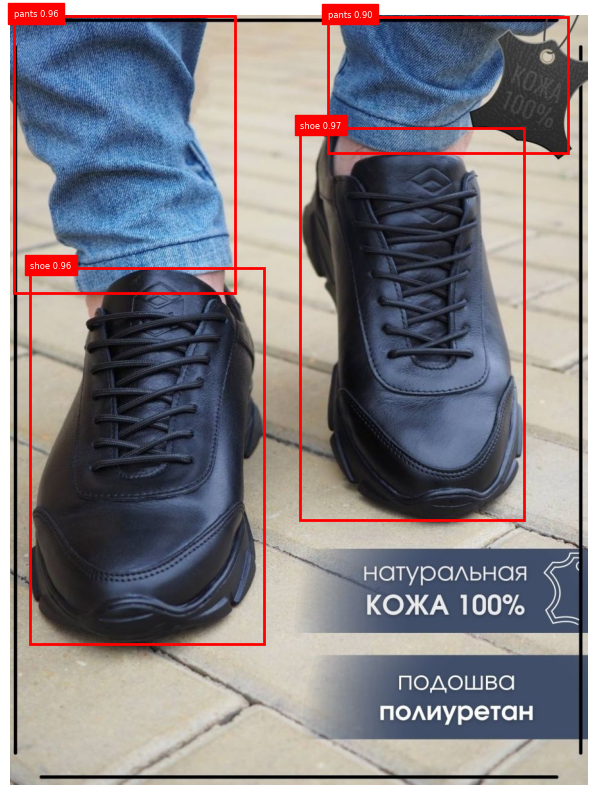


image 1/1 /content/images/90951798.jpg: 480x384 1 pants, 2 shoes, 1 top, 9.7ms
Speed: 1.9ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 384)


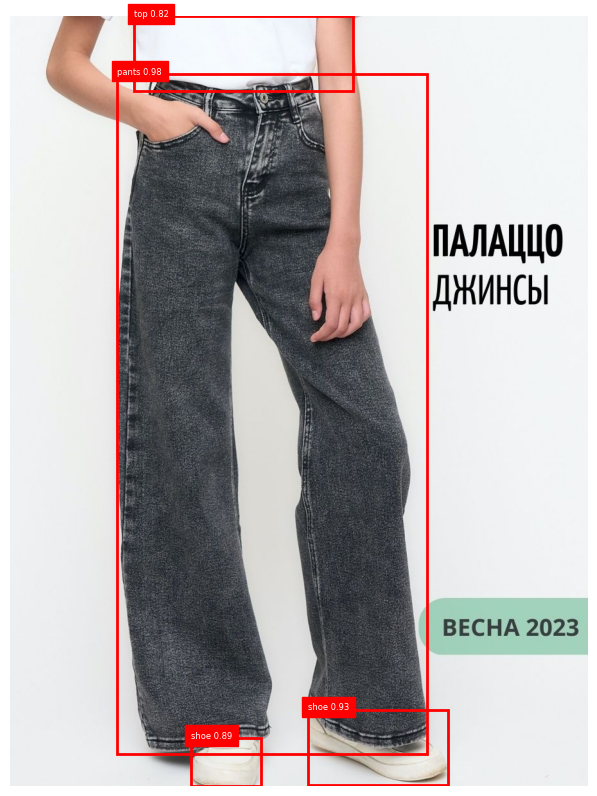


image 1/1 /content/images/10602552.jpg: 480x384 1 accessories, 1 belt, 1 pants, 1 top, 10.2ms
Speed: 1.9ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 384)


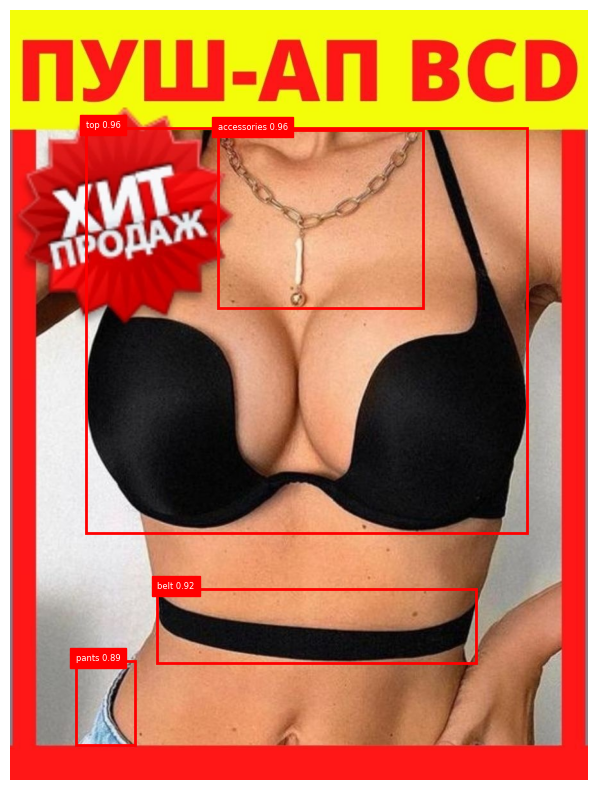


image 1/1 /content/images/34507957.jpg: 480x384 1 accessories, 1 shorts, 1 top, 10.1ms
Speed: 1.9ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 384)


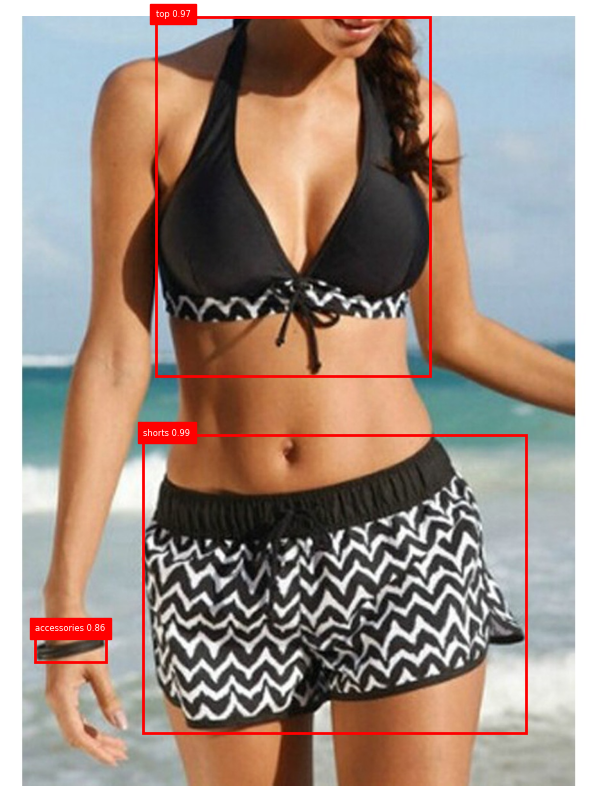


image 1/1 /content/images/16911204.jpg: 480x384 1 accessories, 3 belts, 2 outers, 1 pants, 2 shoes, 1 top, 10.1ms
Speed: 1.9ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 384)


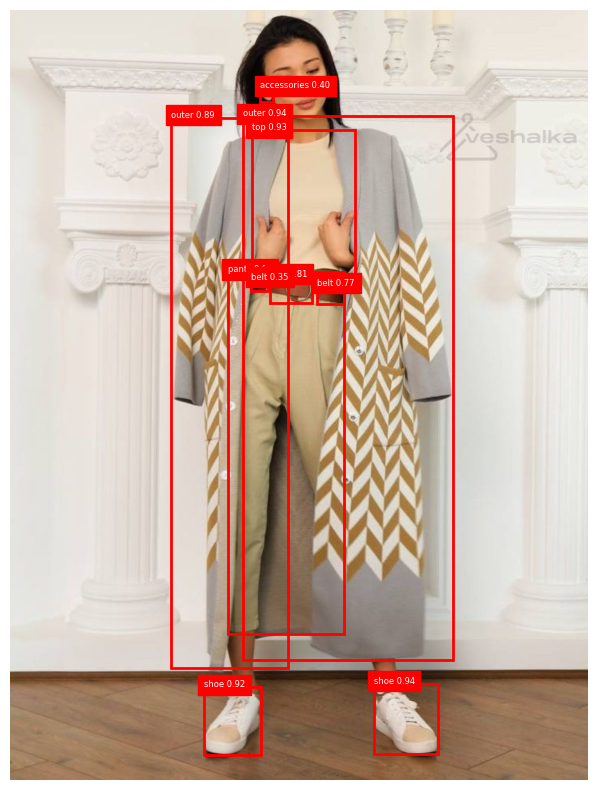


image 1/1 /content/images/131551580.jpg: 480x384 1 outer, 2 tops, 10.3ms
Speed: 1.9ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 384)


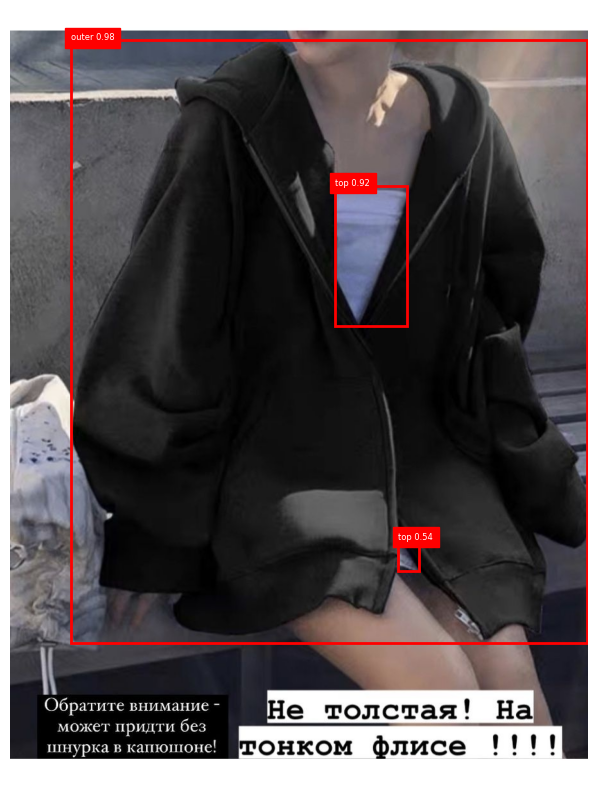


image 1/1 /content/images/78138894.jpg: 480x384 1 pants, 10.0ms
Speed: 1.9ms preprocess, 10.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 384)


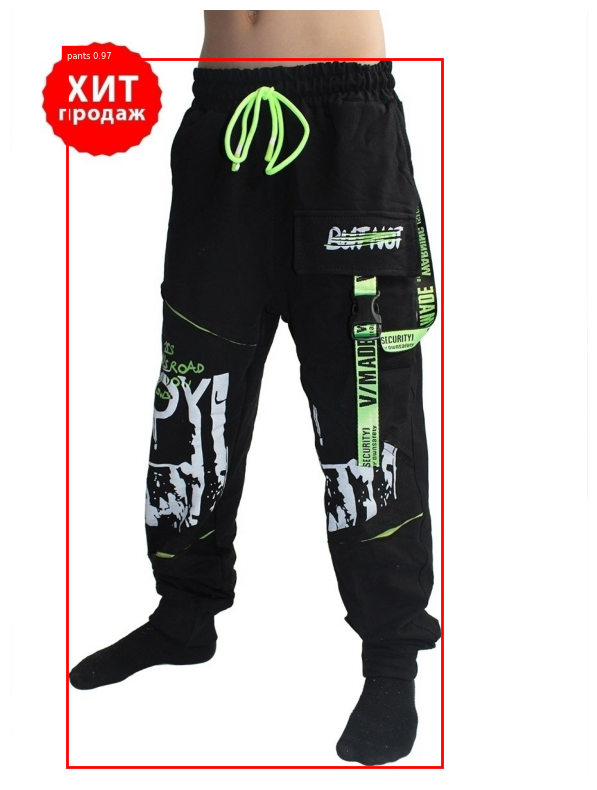


image 1/1 /content/images/122280250.jpg: 480x384 1 accessories, 1 dress, 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 384)


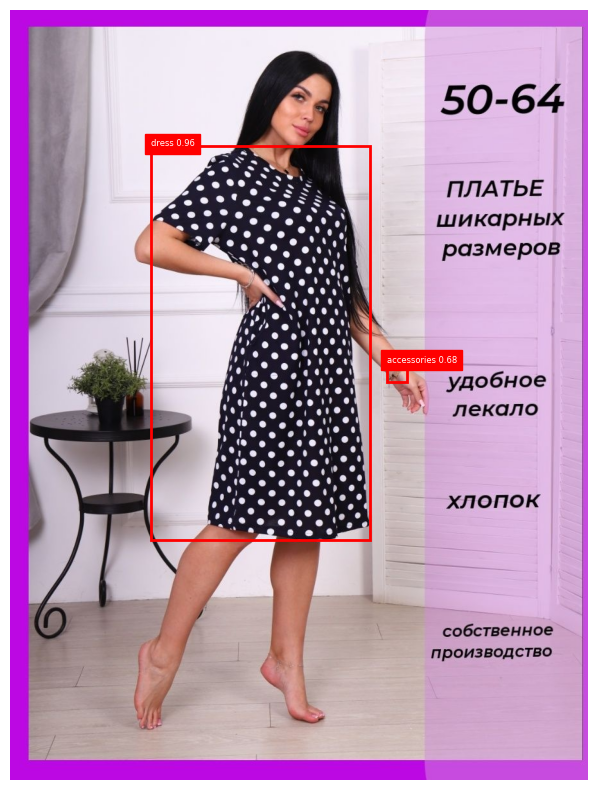


image 1/1 /content/images/13199114.jpg: 480x384 1 top, 10.2ms
Speed: 1.9ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 384)


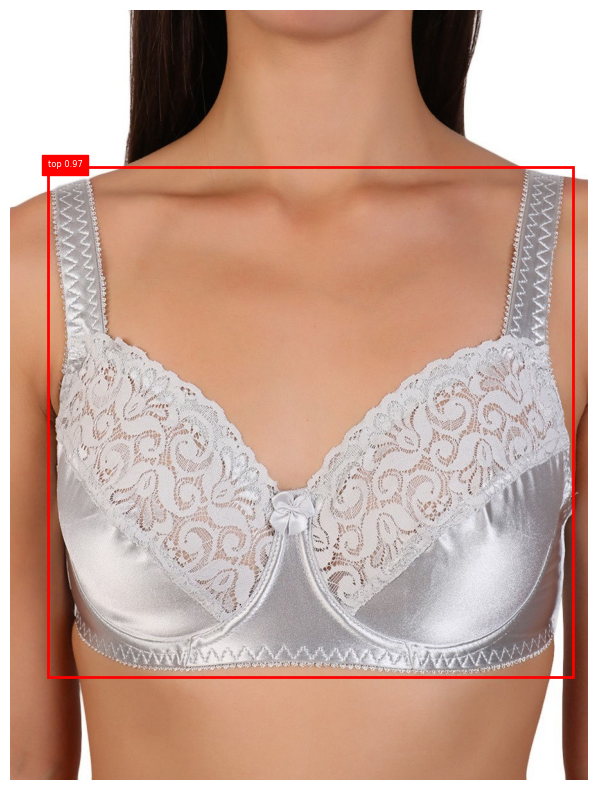


image 1/1 /content/images/42767297.jpg: 480x384 2 bags, 3 pantss, 4 tops, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 384)


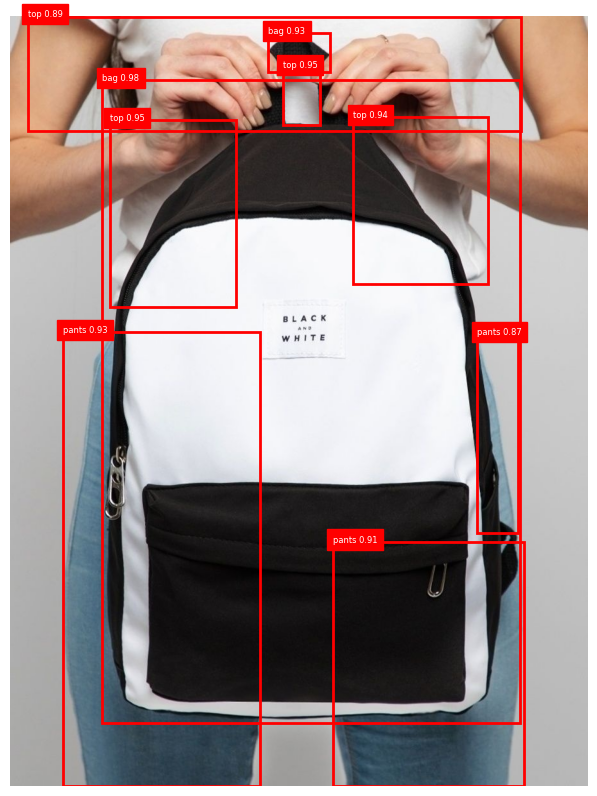


image 1/1 /content/images/24891848.jpg: 480x384 1 accessories, 1 pants, 1 top, 9.6ms
Speed: 1.9ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 384)


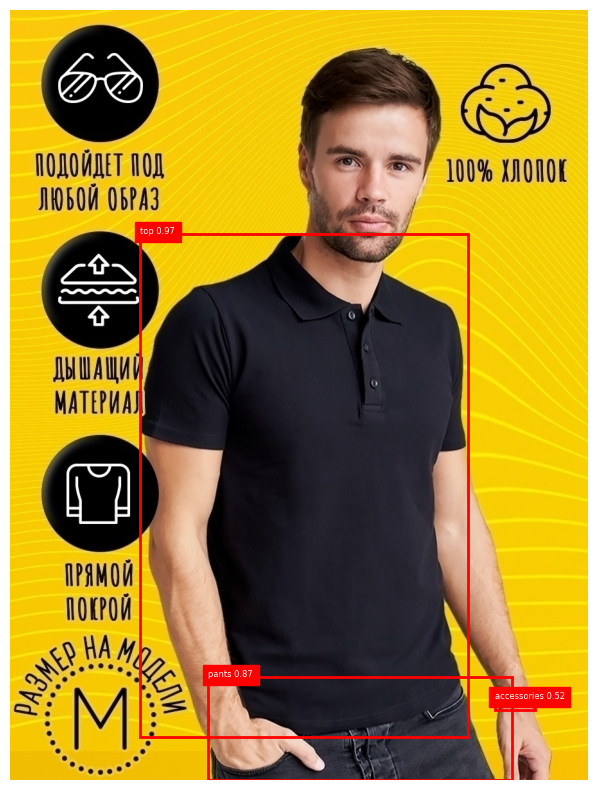

In [ ]:
images_list = os.listdir('/content/images')

for i, image_name in enumerate(images_list):
  image = PILImage.open(f"/content/images/{image_name}")
  results = model(f"/content/images/{image_name}")

  draw_boxes(image, results)
  if i == 10:
    break

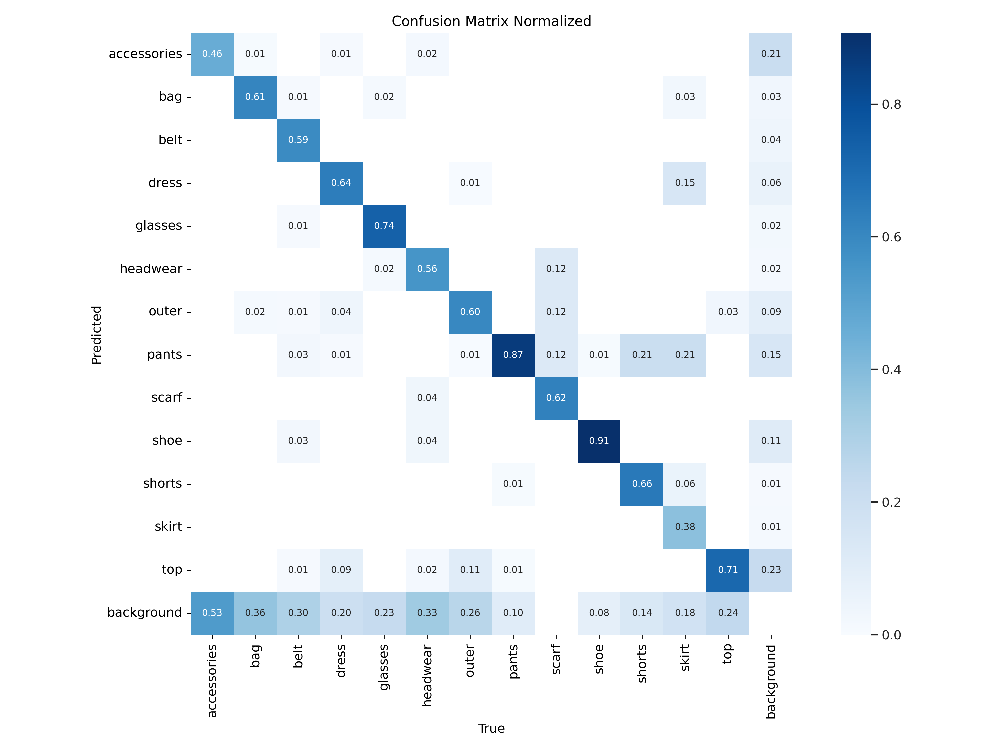

In [ ]:
DisplayImage(filename='/content/runs/detect/train2/confusion_matrix_normalized.png')

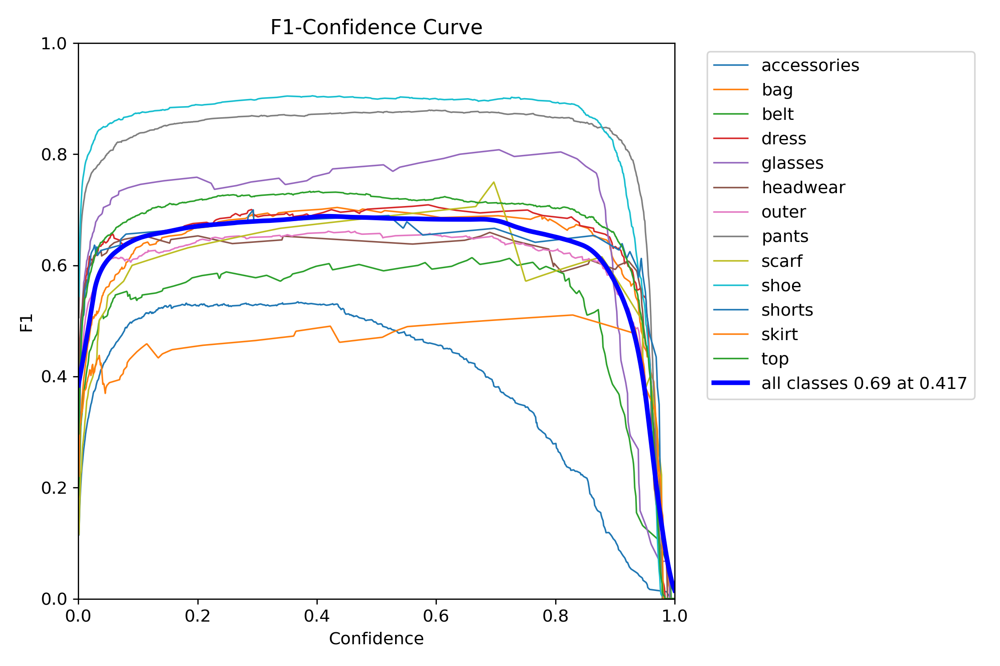

In [ ]:
DisplayImage(filename='/content/runs/detect/train2/F1_curve.png')

## Вывод

F1 равный 0.69 говорит о неплохом качестве детекции с учетом ложноположительных и ложноотрицательных предсказаний

# Тестовый блок для проверки

Поместите сюда весь необходимый код для тестирования вашей модели на новых данных. Убедитесь что

- Импортируются все библиотеки и классы
- Подгружаются веса с внешних ресурсов
- Происходит рассчет метрик
...

In [ ]:
#Здесь загружаем свои данные для теста

In [ ]:
!pip install ultralytics
!pip install yolov8
!pip install gdown

In [ ]:
import gdown
import os
import shutil
import yaml
from ultralytics import YOLO

from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!mkdir test_data

In [ ]:
file_url = 'https://drive.google.com/file/d/1wqgpycLymYsId45sQOo59a2eLNw7k0Qf/view?usp=sharing'
output = 'best_model.pt'

gdown.download(file_url, output, quiet=False)

In [ ]:
classes = ['accessories', 'bag', 'belt', 'dress', 'glasses', 'headwear', 'outer', 'pants', 'scarf', 'shoe', 'shorts', 'skirt', 'top']

In [ ]:
dataset_path = '/content/test_data'

os.makedirs(os.path.join(dataset_path, 'train', 'images'), exist_ok=True)
os.makedirs(os.path.join(dataset_path, 'train', 'labels'), exist_ok=True)
os.makedirs(os.path.join(dataset_path, 'val', 'images'), exist_ok=True)
os.makedirs(os.path.join(dataset_path, 'val', 'labels'), exist_ok=True)

def copy_files(image_list, src_image_folder, src_label_folder, dst_image_folder, dst_label_folder):
    for image_name in image_list:
        base_name = os.path.splitext(image_name)[0]
        src_image_path = os.path.join(src_image_folder, image_name)
        src_label_path = os.path.join(src_label_folder, f"{base_name}.txt")

        dst_image_path = os.path.join(dst_image_folder, image_name)
        dst_label_path = os.path.join(dst_label_folder, f"{base_name}.txt")

        if not os.path.exists(src_image_path):
            print(f"Image file not found: {src_image_path}")
            continue
        if not os.path.exists(src_label_path):
            print(f"Label file not found: {src_label_path}")
            continue

        shutil.copyfile(src_image_path, dst_image_path)
        shutil.copyfile(src_label_path, dst_label_path)


src_images_path = '/content/images'
src_labels_path = '/content/labels'

images_test = os.listdir('/content/images')

copy_files(images_test, src_images_path, src_labels_path, os.path.join(dataset_path, 'val', 'images'), os.path.join(dataset_path, 'val', 'labels'))

In [ ]:
data = {
  "train": "/content/test_data/train/images",
  "val": "/content/test_data/val/images",
  "nc": len(classes),
  "names": classes
}

with open("/content/data.yaml", "w") as file:
  yaml.dump(data, file)

In [ ]:
model = YOLO('best.pt')
model = model.to(device)
model.val(data='/content/data.yaml')

In [ ]:
metrics = model.val()
print(metrics)

In [ ]:
def draw_boxes(image, results):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    ax = plt.gca()

    for result in results[0].boxes:
        x1, y1, x2, y2 = result.xyxy[0].cpu().numpy()
        label = model.names[int(result.cls)]
        score = result.conf.cpu().item()

        rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, color='red', linewidth=2)
        ax.add_patch(rect)
        plt.text(x1, y1, f'{label} {score:.2f}', color='white', fontsize=6, backgroundcolor='red')

    plt.axis('off')
    plt.show()

In [ ]:
images_list = os.listdir('/content/images')

for i, image_name in enumerate(images_list):
  image = PILImage.open(f"/content/images/{image_name}")
  results = model(f"/content/images/{image_name}")

  draw_boxes(image, results)
  if i == 5:
    break